MCMC Gibbs sampling

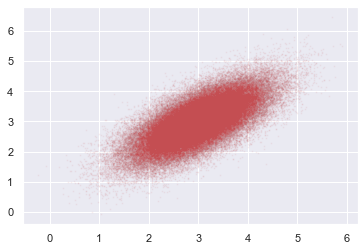

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
seaborn.set()

#依照z1|z2的条件高斯分布公式，给定z2的条件情况下采样出z1
def p_z1_given_z2(z2, mu, sigma):
    mu = mu[0] + sigma[1][0] / sigma[0][0] * (z2 - mu[1])
    sigma = sigma[0][0] - sigma[1][0]**2 / sigma[1][1]
    return np.random.normal(mu, sigma)

#依照z2|z1的条件高斯分布公式，给定z1的条件情况下采样出z2
def p_z2_given_z1(z1, mu, sigma):
    mu = mu[1] + sigma[0][1] / sigma[1][1] * (z1 - mu[0])
    sigma = sigma[1][1] - sigma[0][1]**2 / sigma[0][0]
    return np.random.normal(mu, sigma)

#Gibbs采样过程
def gibbs_sampling(mu, sigma, samples_period):
    samples = np.zeros((samples_period, 2))
    z2 = np.random.rand() * 10

    for i in range(samples_period):
        z1 = p_z1_given_z2(z2, mu, sigma)
        z2 = p_z2_given_z1(z1, mu, sigma)
        samples[i, :] = [z1, z2]

    return samples


#目标分布p(z)
mus = np.array([3, 3])
sigmas = np.array([[1, .7], [.7, 1]])

#确定总的采样期和燃烧期
burn_period = int(1e4)
samples_period = int(1e5)
#得到采样样本，舍弃燃烧期样本点
samples = gibbs_sampling(mus, sigmas, samples_period)[burn_period:]
plt.plot(samples[:, 0], samples[:, 1], 'ro', alpha=0.05, markersize=1)
plt.show()